In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sms

%matplotlib inline

# Ignore harmless warnings 

import warnings 
warnings.filterwarnings("ignore")

# Set to display all the columns in dataset

pd.set_option("display.max_columns", None)

# Import psql to run queries 

import pandasql as psql

In [2]:
# Load the heart disease dataset

HDdata= pd.read_csv(r"C:\Users\Dlc\Downloads\framingham.csv", header=0)

# Copy to back-uo file

HDdata_bk=HDdata.copy()

# Display the first five records

HDdata.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [3]:
# Display the dataset information

HDdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4238 entries, 0 to 4237
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   male             4238 non-null   int64  
 1   age              4238 non-null   int64  
 2   education        4133 non-null   float64
 3   currentSmoker    4238 non-null   int64  
 4   cigsPerDay       4209 non-null   float64
 5   BPMeds           4185 non-null   float64
 6   prevalentStroke  4238 non-null   int64  
 7   prevalentHyp     4238 non-null   int64  
 8   diabetes         4238 non-null   int64  
 9   totChol          4188 non-null   float64
 10  sysBP            4238 non-null   float64
 11  diaBP            4238 non-null   float64
 12  BMI              4219 non-null   float64
 13  heartRate        4237 non-null   float64
 14  glucose          3850 non-null   float64
 15  TenYearCHD       4238 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 529.9 KB


In [4]:
# Count the target or dependent variable by '0' or '1' and their proportion
# (>=10 : 1, then the dataset is imbalance data)
TenYearCHD_count=HDdata.TenYearCHD.value_counts()
print('Class 0:',TenYearCHD_count[0])
print('Class 1:',TenYearCHD_count[1])
print('proportion:',round(TenYearCHD_count[0]/TenYearCHD_count[1],2),':1')
print('Total TenYearCHD Records:',len(HDdata))

Class 0: 3594
Class 1: 644
proportion: 5.58 :1
Total TenYearCHD Records: 4238


In [5]:
# display the size of the dataset

HDdata.shape

(4238, 16)

In [6]:
# Display the duplicate values 

HDdata_dup=HDdata[HDdata.duplicated(keep='last')]

# Display the duplicate records

HDdata_dup

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD


In [7]:
# Identify the missing values

HDdata.isnull().sum()

male                 0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
dtype: int64

In [8]:

from sklearn.impute import KNNImputer
Imputer_knn=KNNImputer(missing_values=np.nan)
HDdata['education']=Imputer_knn.fit_transform(HDdata[['education']])
HDdata['cigsPerDay']=Imputer_knn.fit_transform(HDdata[['cigsPerDay']])
HDdata['BPMeds']=Imputer_knn.fit_transform(HDdata[['BPMeds']])
HDdata['totChol']=Imputer_knn.fit_transform(HDdata[['totChol']])
HDdata['BMI']=Imputer_knn.fit_transform(HDdata[['BMI']])
HDdata['heartRate']=Imputer_knn.fit_transform(HDdata[['heartRate']])
HDdata['glucose']=Imputer_knn.fit_transform(HDdata[['glucose']])
HDdata

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.00000,0,0,0,195.0,106.0,70.0,26.97,80.0,77.000000,0
1,0,46,2.0,0,0.0,0.00000,0,0,0,250.0,121.0,81.0,28.73,95.0,76.000000,0
2,1,48,1.0,1,20.0,0.00000,0,0,0,245.0,127.5,80.0,25.34,75.0,70.000000,0
3,0,61,3.0,1,30.0,0.00000,0,1,0,225.0,150.0,95.0,28.58,65.0,103.000000,1
4,0,46,3.0,1,23.0,0.00000,0,0,0,285.0,130.0,84.0,23.10,85.0,85.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,1,50,1.0,1,1.0,0.00000,0,1,0,313.0,179.0,92.0,25.97,66.0,86.000000,1
4234,1,51,3.0,1,43.0,0.00000,0,0,0,207.0,126.5,80.0,19.71,65.0,68.000000,0
4235,0,48,2.0,1,20.0,0.02963,0,0,0,248.0,131.0,72.0,22.00,84.0,86.000000,0
4236,0,44,1.0,1,15.0,0.00000,0,0,0,210.0,126.5,87.0,19.16,86.0,81.966753,0


In [9]:
# Identify the missing values

HDdata.isnull().sum()

male               0
age                0
education          0
currentSmoker      0
cigsPerDay         0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
totChol            0
sysBP              0
diaBP              0
BMI                0
heartRate          0
glucose            0
TenYearCHD         0
dtype: int64

In [10]:
# To display the descriptive stastics 

HDdata.describe()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
count,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.00000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000,4238.000000
mean,0.429212,49.584946,1.978950,0.494101,9.003089,0.02963,0.005899,0.310524,0.025720,236.721585,132.352407,82.893464,25.802008,75.878924,81.966753,0.151958
std,0.495022,8.572160,1.007075,0.500024,11.879230,0.16852,0.076587,0.462763,0.158316,44.326453,22.038097,11.910850,4.070953,12.025177,22.836603,0.359023
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.080000,68.000000,72.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.410000,75.000000,80.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.00000,0.000000,1.000000,0.000000,262.000000,144.000000,89.875000,28.037500,83.000000,85.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.00000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


In [11]:
# Identify independent and target variables

IndepVar=[]
for col in HDdata.columns:
    if col !='TenYearCHD':
        IndepVar.append(col)
        
TargetVar='TenYearCHD'
x=HDdata[IndepVar]
y=HDdata[TargetVar]

In [12]:
# Split the data into train and test (random sampling)

from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=143)

# Display the shape for train & test data

x_train.shape, x_test.shape, y_train.shape, y_test.shape

((2966, 15), (1272, 15), (2966,), (1272,))

In [13]:
# Scaling the features by using MinMaxScaler

from sklearn.preprocessing import MinMaxScaler

mmscaler = MinMaxScaler(feature_range=(0, 1))

x_train = mmscaler.fit_transform(x_train)
x_train = pd.DataFrame(x_train)

x_test = mmscaler.fit_transform(x_test)
x_test = pd.DataFrame(x_test)


# LOGISTIC REGRESSION

In [14]:
# Import logistic regression

from sklearn.linear_model import LogisticRegression
ModelLR=LogisticRegression()
ModelLR.fit(x_train,y_train)
y_pred=ModelLR.predict(x_test)
y_pred_prob=ModelLR.predict_proba(x_test)

In [15]:
# To display the algorithm hyperparameters
params=ModelLR.get_params()
print(params)

{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


In [16]:
# confusion matrix and classification matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
# actual values
actual=y_test
# predicted values 
predicted=y_pred
matrix=confusion_matrix(actual,predicted,labels=[1,0],sample_weight=None,normalize=None)
print('Confusion matrix:\n',matrix)
tp,fn,fp,tn=confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values:\n',tp,fn,fp,tn)

Confusion matrix:
 [[   8  182]
 [   5 1077]]
Outcome values:
 8 182 5 1077


Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.04      0.08       190
           0       0.86      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.74      0.52      0.50      1272
weighted avg       0.82      0.85      0.79      1272

Accuracy : 85.3 %
Precision : 61.5 %
Recall : 4.2 %
F1 Score : 0.079
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 51.8 %
MCC : 0.133
roc_auc_score: 0.519


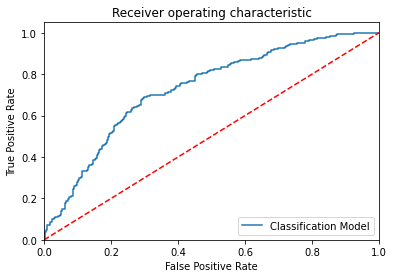

-----------------------------------------------------------------------------------------------------


In [17]:
# 'Confusion matrix' and 'classification report' in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test
# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelLR.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [18]:
Results = pd.DataFrame({'TenYearCHD_A':y_test, 'TenYearCHD_P':y_pred})

# Merge two Dataframes on index of both the dataframes

ResultsFinal = HDdata.merge(Results, left_index=True, right_index=True)

# Display 5 records randomly

ResultsFinal.sample(5)


,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD,TenYearCHD_A,TenYearCHD_P
1146,1,57,1.00000,1,30.0,0.0,0,0,0,225.0,140.0,88.0,24.71,80.0,78.0,0,0,0
1069,1,52,1.00000,0,0.0,0.0,0,0,0,200.0,114.0,77.0,28.28,66.0,84.0,0,0,0
4012,0,40,1.97895,1,9.0,0.0,0,0,0,262.0,97.0,71.0,22.14,72.0,80.0,0,0,0
4104,0,38,2.00000,0,0.0,0.0,0,0,0,175.0,142.0,86.0,22.01,82.0,73.0,0,0,0
2155,1,38,3.00000,0,0.0,0.0,0,0,0,305.0,130.0,95.0,23.10,65.0,78.0,1,1,0


# DECISION TREE

In [19]:
# Import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
ModelDT=DecisionTreeClassifier()
ModelDT.fit(x_train,y_train)
y_pred=ModelDT.predict(x_test)
y_pred_prob=ModelDT.predict_proba(x_test)

In [20]:
# To display the algorithm hyperparameters

params = ModelDT.get_params()
print(params)

{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


Confusion matrix:
 [[ 83 107]
 [363 719]]
Outcome values:
 83 107 363 719
Classification report : 
               precision    recall  f1-score   support

           1       0.19      0.44      0.26       190
           0       0.87      0.66      0.75      1082

    accuracy                           0.63      1272
   macro avg       0.53      0.55      0.51      1272
weighted avg       0.77      0.63      0.68      1272

Accuracy : 63.1 %
Precision : 18.6 %
Recall : 43.7 %
F1 Score : 0.261
Specificity or True Negative Rate : 66.5 %
Balanced Accuracy : 55.1 %
MCC : 0.076
roc_auc_score: 0.551


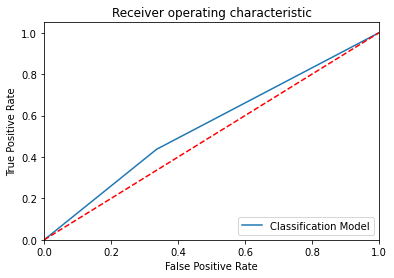

-----------------------------------------------------------------------------------------------------


In [21]:
# confusion matrix and classification matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
# actual values
actual=y_test
# predicted values 
predicted=y_pred
matrix=confusion_matrix(actual,predicted,labels=[1,0],sample_weight=None,normalize=None)
print('Confusion matrix:\n',matrix)
tp,fn,fp,tn=confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values:\n',tp,fn,fp,tn)
# 'Confusion matrix' and 'classification report' in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test
# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelDT.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [22]:

Results = pd.DataFrame({'TenYearCHD_A':y_test, 'TenYearCHD_P':y_pred})

# Merge two Dataframes on index of both the dataframes

ResultsFinal = HDdata.merge(Results, left_index=True, right_index=True)

# Display 5 records randomly

ResultsFinal.sample(5)


,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD,TenYearCHD_A,TenYearCHD_P
1350,0,49,3.0,1,10.0,0.0,0,0,0,260.0,123.0,80.0,23.10,63.0,65.000000,1,1,0
3043,1,57,4.0,0,0.0,0.0,0,0,0,235.0,123.0,78.0,28.53,60.0,74.000000,0,0,1
1542,0,63,2.0,0,0.0,0.0,0,1,0,293.0,186.5,97.0,30.47,60.0,96.000000,0,0,0
1184,0,64,2.0,1,3.0,0.0,0,0,0,315.0,135.0,80.0,25.23,103.0,89.000000,0,0,1
246,0,61,3.0,0,0.0,0.0,0,1,0,189.0,133.0,83.0,22.82,87.0,81.966753,1,1,0


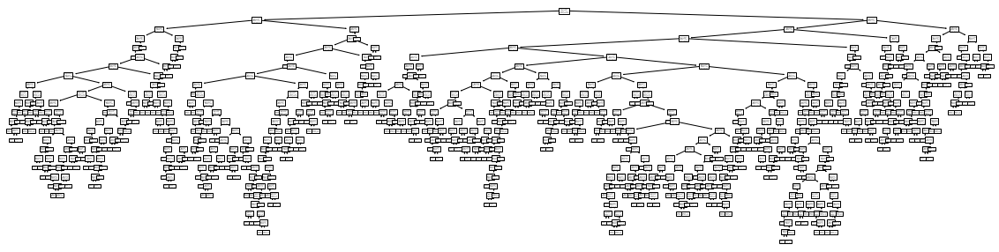

In [23]:
import matplotlib.pyplot as plt
from sklearn import tree
plt.figure(figsize=(20,5))
tree.plot_tree(ModelDT);

# RANDOMFOREST

In [24]:
# Import RandomForestClassifier

from sklearn.ensemble import RandomForestClassifier
ModelRF=RandomForestClassifier()
ModelRF.fit(x_train,y_train)
y_pred=ModelRF.predict(x_test)
y_pred_prob=ModelRF.predict_proba(x_test)

In [25]:
# To display the algorithm hyperparameters

params = ModelRF.get_params()
print(params)

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


Confusion matrix:
 [[  14  176]
 [  12 1070]]
Outcome values:
 14 176 12 1070
Classification report : 
               precision    recall  f1-score   support

           1       0.54      0.07      0.13       190
           0       0.86      0.99      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.70      0.53      0.52      1272
weighted avg       0.81      0.85      0.80      1272

Accuracy : 85.2 %
Precision : 53.8 %
Recall : 7.4 %
F1 Score : 0.13
Specificity or True Negative Rate : 98.9 %
Balanced Accuracy : 53.2 %
MCC : 0.158
roc_auc_score: 0.531


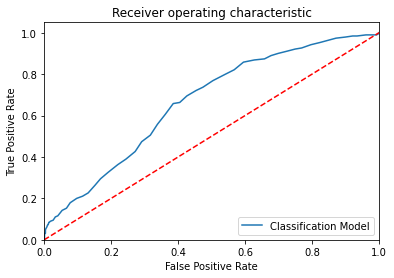

-----------------------------------------------------------------------------------------------------


In [26]:
# confusion matrix and classification matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
# actual values
actual=y_test
# predicted values 
predicted=y_pred
matrix=confusion_matrix(actual,predicted,labels=[1,0],sample_weight=None,normalize=None)
print('Confusion matrix:\n',matrix)
tp,fn,fp,tn=confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values:\n',tp,fn,fp,tn)
# 'Confusion matrix' and 'classification report' in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test
# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelRF.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [27]:
Results = pd.DataFrame({'TenYearCHD_A':y_test, 'TenYearCHD_P':y_pred})

# Merge two Dataframes on index of both the dataframes

ResultsFinal = HDdata.merge(Results, left_index=True, right_index=True)

# Display 5 records randomly

ResultsFinal.sample(5)


,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD,TenYearCHD_A,TenYearCHD_P
3756,0,46,3.0,1,15.0,0.0,0,1,0,274.0,158.0,97.0,22.83,92.0,78.0,0,0,0
2790,0,53,1.0,0,0.0,0.0,0,1,0,268.0,156.0,100.0,26.73,85.0,69.0,0,0,0
3735,0,55,1.0,0,0.0,0.0,0,0,0,257.0,132.0,81.0,27.49,60.0,86.0,0,0,0
3774,0,51,2.0,0,0.0,0.0,0,0,0,295.0,131.0,87.0,24.41,85.0,77.0,0,0,0
4020,0,55,1.0,0,0.0,0.0,0,0,0,266.0,107.0,70.0,24.51,72.0,77.0,0,0,0


# KNN CLASSIFIER

In [28]:
KNN_Results = pd.read_csv(r"C:\Users\Dlc\Downloads\KNN_Results (1).csv",header=0)
KNN_Results.head()

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


KNN_K_value =  1
Model Name:  KNeighborsClassifier(n_neighbors=1)
Confusion matrix : 
 [[ 47 143]
 [126 956]]
Outcome values : 
 47 143 126 956
Classification report : 
               precision    recall  f1-score   support

           1       0.27      0.25      0.26       190
           0       0.87      0.88      0.88      1082

    accuracy                           0.79      1272
   macro avg       0.57      0.57      0.57      1272
weighted avg       0.78      0.79      0.78      1272

Accuracy : 78.9 %
Precision : 27.2 %
Recall : 24.7 %
F1 Score : 0.259
Specificity or True Negative Rate : 88.4 %
Balanced Accuracy : 56.6 %
MCC : 0.136
roc_auc_score: 0.565


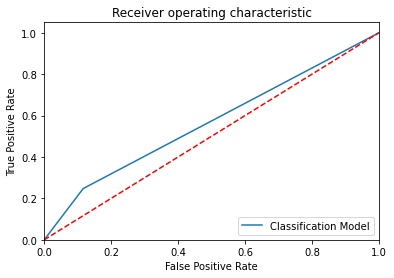

KNN_K_value =  2
Model Name:  KNeighborsClassifier(n_neighbors=2)
Confusion matrix : 
 [[  11  179]
 [  27 1055]]
Outcome values : 
 11 179 27 1055
Classification report : 
               precision    recall  f1-score   support

           1       0.29      0.06      0.10       190
           0       0.85      0.98      0.91      1082

    accuracy                           0.84      1272
   macro avg       0.57      0.52      0.50      1272
weighted avg       0.77      0.84      0.79      1272

Accuracy : 83.8 %
Precision : 28.9 %
Recall : 5.8 %
F1 Score : 0.096
Specificity or True Negative Rate : 97.5 %
Balanced Accuracy : 51.6 %
MCC : 0.069
roc_auc_score: 0.516


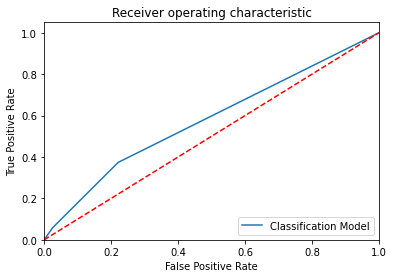

KNN_K_value =  3
Model Name:  KNeighborsClassifier(n_neighbors=3)
Confusion matrix : 
 [[  27  163]
 [  70 1012]]
Outcome values : 
 27 163 70 1012
Classification report : 
               precision    recall  f1-score   support

           1       0.28      0.14      0.19       190
           0       0.86      0.94      0.90      1082

    accuracy                           0.82      1272
   macro avg       0.57      0.54      0.54      1272
weighted avg       0.77      0.82      0.79      1272

Accuracy : 81.7 %
Precision : 27.8 %
Recall : 14.2 %
F1 Score : 0.188
Specificity or True Negative Rate : 93.5 %
Balanced Accuracy : 53.8 %
MCC : 0.104
roc_auc_score: 0.539


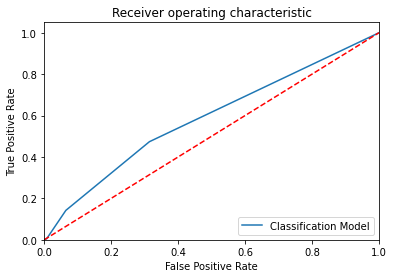

KNN_K_value =  4
Model Name:  KNeighborsClassifier(n_neighbors=4)
Confusion matrix : 
 [[   7  183]
 [  24 1058]]
Outcome values : 
 7 183 24 1058
Classification report : 
               precision    recall  f1-score   support

           1       0.23      0.04      0.06       190
           0       0.85      0.98      0.91      1082

    accuracy                           0.84      1272
   macro avg       0.54      0.51      0.49      1272
weighted avg       0.76      0.84      0.78      1272

Accuracy : 83.7 %
Precision : 22.6 %
Recall : 3.7 %
F1 Score : 0.063
Specificity or True Negative Rate : 97.8 %
Balanced Accuracy : 50.7 %
MCC : 0.034
roc_auc_score: 0.507


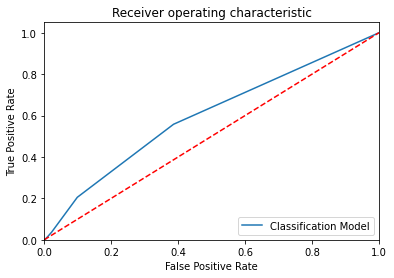

KNN_K_value =  5
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[  16  174]
 [  41 1041]]
Outcome values : 
 16 174 41 1041
Classification report : 
               precision    recall  f1-score   support

           1       0.28      0.08      0.13       190
           0       0.86      0.96      0.91      1082

    accuracy                           0.83      1272
   macro avg       0.57      0.52      0.52      1272
weighted avg       0.77      0.83      0.79      1272

Accuracy : 83.1 %
Precision : 28.1 %
Recall : 8.4 %
F1 Score : 0.13
Specificity or True Negative Rate : 96.2 %
Balanced Accuracy : 52.3 %
MCC : 0.08
roc_auc_score: 0.523


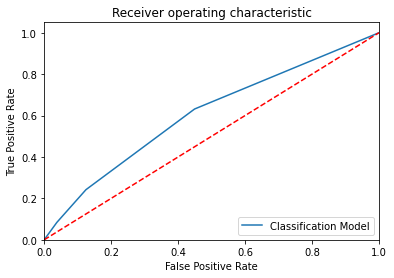

KNN_K_value =  6
Model Name:  KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[   4  186]
 [  11 1071]]
Outcome values : 
 4 186 11 1071
Classification report : 
               precision    recall  f1-score   support

           1       0.27      0.02      0.04       190
           0       0.85      0.99      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.56      0.51      0.48      1272
weighted avg       0.76      0.85      0.78      1272

Accuracy : 84.5 %
Precision : 26.7 %
Recall : 2.1 %
F1 Score : 0.039
Specificity or True Negative Rate : 99.0 %
Balanced Accuracy : 50.5 %
MCC : 0.036
roc_auc_score: 0.505


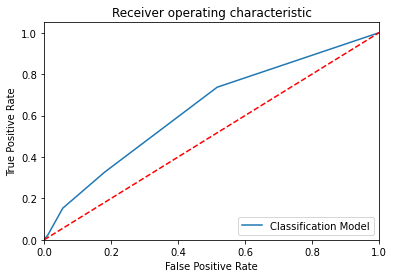

KNN_K_value =  7
Model Name:  KNeighborsClassifier(n_neighbors=7)
Confusion matrix : 
 [[   6  184]
 [  17 1065]]
Outcome values : 
 6 184 17 1065
Classification report : 
               precision    recall  f1-score   support

           1       0.26      0.03      0.06       190
           0       0.85      0.98      0.91      1082

    accuracy                           0.84      1272
   macro avg       0.56      0.51      0.49      1272
weighted avg       0.76      0.84      0.79      1272

Accuracy : 84.2 %
Precision : 26.1 %
Recall : 3.2 %
F1 Score : 0.056
Specificity or True Negative Rate : 98.4 %
Balanced Accuracy : 50.8 %
MCC : 0.042
roc_auc_score: 0.508


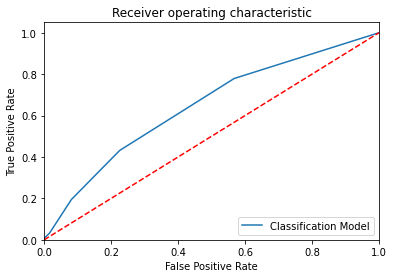

KNN_K_value =  8
Model Name:  KNeighborsClassifier(n_neighbors=8)
Confusion matrix : 
 [[   2  188]
 [   4 1078]]
Outcome values : 
 2 188 4 1078
Classification report : 
               precision    recall  f1-score   support

           1       0.33      0.01      0.02       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.59      0.50      0.47      1272
weighted avg       0.77      0.85      0.78      1272

Accuracy : 84.9 %
Precision : 33.3 %
Recall : 1.1 %
F1 Score : 0.02
Specificity or True Negative Rate : 99.6 %
Balanced Accuracy : 50.3 %
MCC : 0.036
roc_auc_score: 0.503


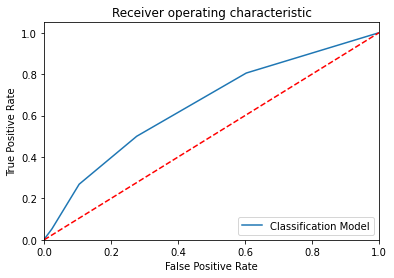

KNN_K_value =  9
Model Name:  KNeighborsClassifier(n_neighbors=9)
Confusion matrix : 
 [[   5  185]
 [   6 1076]]
Outcome values : 
 5 185 6 1076
Classification report : 
               precision    recall  f1-score   support

           1       0.45      0.03      0.05       190
           0       0.85      0.99      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.65      0.51      0.48      1272
weighted avg       0.79      0.85      0.79      1272

Accuracy : 85.0 %
Precision : 45.5 %
Recall : 2.6 %
F1 Score : 0.05
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 51.0 %
MCC : 0.08
roc_auc_score: 0.51


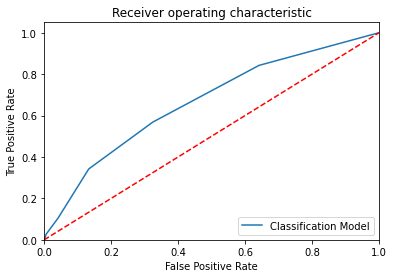

KNN_K_value =  10
Model Name:  KNeighborsClassifier(n_neighbors=10)
Confusion matrix : 
 [[   2  188]
 [   4 1078]]
Outcome values : 
 2 188 4 1078
Classification report : 
               precision    recall  f1-score   support

           1       0.33      0.01      0.02       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.59      0.50      0.47      1272
weighted avg       0.77      0.85      0.78      1272

Accuracy : 84.9 %
Precision : 33.3 %
Recall : 1.1 %
F1 Score : 0.02
Specificity or True Negative Rate : 99.6 %
Balanced Accuracy : 50.3 %
MCC : 0.036
roc_auc_score: 0.503


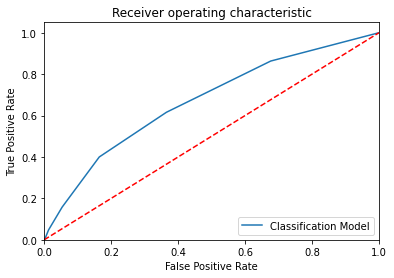

KNN_K_value =  11
Model Name:  KNeighborsClassifier(n_neighbors=11)
Confusion matrix : 
 [[   3  187]
 [   6 1076]]
Outcome values : 
 3 187 6 1076
Classification report : 
               precision    recall  f1-score   support

           1       0.33      0.02      0.03       190
           0       0.85      0.99      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.59      0.51      0.47      1272
weighted avg       0.77      0.85      0.79      1272

Accuracy : 84.8 %
Precision : 33.3 %
Recall : 1.6 %
F1 Score : 0.03
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 50.5 %
MCC : 0.044
roc_auc_score: 0.505


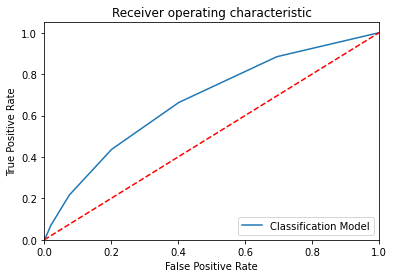

KNN_K_value =  12
Model Name:  KNeighborsClassifier(n_neighbors=12)
Confusion matrix : 
 [[   2  188]
 [   1 1081]]
Outcome values : 
 2 188 1 1081
Classification report : 
               precision    recall  f1-score   support

           1       0.67      0.01      0.02       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.76      0.50      0.47      1272
weighted avg       0.82      0.85      0.79      1272

Accuracy : 85.1 %
Precision : 66.7 %
Recall : 1.1 %
F1 Score : 0.021
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 50.5 %
MCC : 0.071
roc_auc_score: 0.505


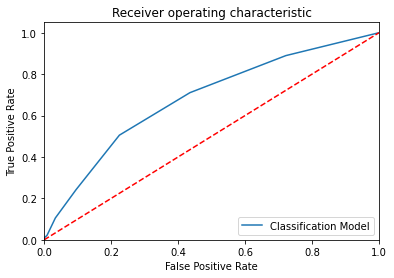

KNN_K_value =  13
Model Name:  KNeighborsClassifier(n_neighbors=13)
Confusion matrix : 
 [[   2  188]
 [   2 1080]]
Outcome values : 
 2 188 2 1080
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.01      0.02       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.68      0.50      0.47      1272
weighted avg       0.80      0.85      0.78      1272

Accuracy : 85.1 %
Precision : 50.0 %
Recall : 1.1 %
F1 Score : 0.021
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 50.4 %
MCC : 0.055
roc_auc_score: 0.504


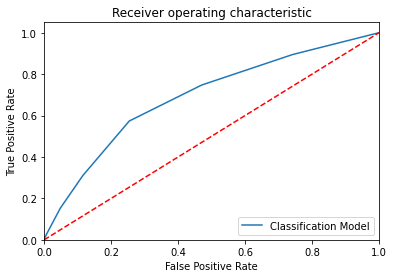

KNN_K_value =  14
Model Name:  KNeighborsClassifier(n_neighbors=14)
Confusion matrix : 
 [[   1  189]
 [   1 1081]]
Outcome values : 
 1 189 1 1081
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.01      0.01       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.68      0.50      0.46      1272
weighted avg       0.80      0.85      0.78      1272

Accuracy : 85.1 %
Precision : 50.0 %
Recall : 0.5 %
F1 Score : 0.01
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 50.2 %
MCC : 0.039
roc_auc_score: 0.502


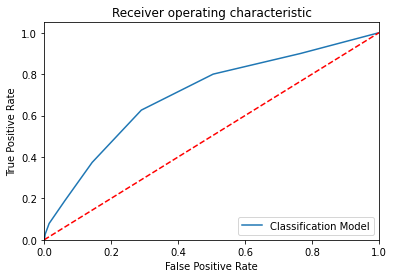

KNN_K_value =  15
Model Name:  KNeighborsClassifier(n_neighbors=15)
Confusion matrix : 
 [[   2  188]
 [   1 1081]]
Outcome values : 
 2 188 1 1081
Classification report : 
               precision    recall  f1-score   support

           1       0.67      0.01      0.02       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.76      0.50      0.47      1272
weighted avg       0.82      0.85      0.79      1272

Accuracy : 85.1 %
Precision : 66.7 %
Recall : 1.1 %
F1 Score : 0.021
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 50.5 %
MCC : 0.071
roc_auc_score: 0.505


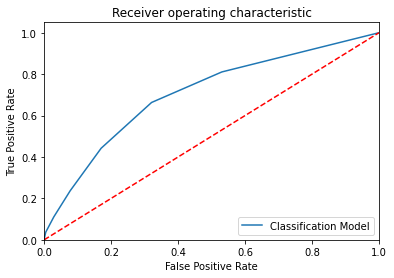

KNN_K_value =  16
Model Name:  KNeighborsClassifier(n_neighbors=16)
Confusion matrix : 
 [[   0  190]
 [   1 1081]]
Outcome values : 
 0 190 1 1081
Classification report : 
               precision    recall  f1-score   support

           1       0.00      0.00      0.00       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.43      0.50      0.46      1272
weighted avg       0.72      0.85      0.78      1272

Accuracy : 85.0 %
Precision : 0.0 %
Recall : 0.0 %
F1 Score : 0.0
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 50.0 %
MCC : -0.012
roc_auc_score: 0.5


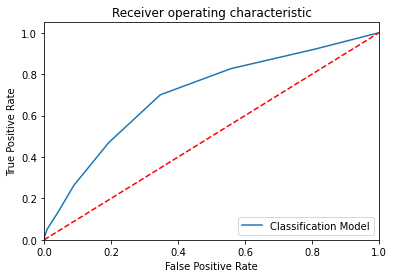

KNN_K_value =  17
Model Name:  KNeighborsClassifier(n_neighbors=17)
Confusion matrix : 
 [[   1  189]
 [   1 1081]]
Outcome values : 
 1 189 1 1081
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.01      0.01       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.68      0.50      0.46      1272
weighted avg       0.80      0.85      0.78      1272

Accuracy : 85.1 %
Precision : 50.0 %
Recall : 0.5 %
F1 Score : 0.01
Specificity or True Negative Rate : 99.9 %
Balanced Accuracy : 50.2 %
MCC : 0.039
roc_auc_score: 0.502


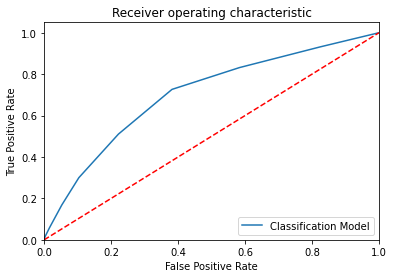

KNN_K_value =  18
Model Name:  KNeighborsClassifier(n_neighbors=18)
Confusion matrix : 
 [[   0  190]
 [   0 1082]]
Outcome values : 
 0 190 0 1082
Classification report : 
               precision    recall  f1-score   support

           1       0.00      0.00      0.00       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.43      0.50      0.46      1272
weighted avg       0.72      0.85      0.78      1272

Accuracy : 85.1 %
Precision : nan %
Recall : 0.0 %
F1 Score : 0.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 50.0 %
MCC : nan
roc_auc_score: 0.5


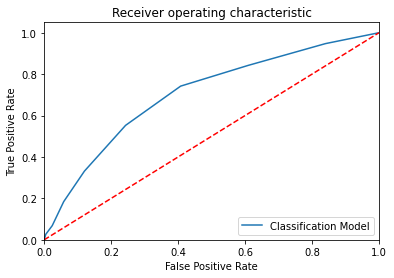

KNN_K_value =  19
Model Name:  KNeighborsClassifier(n_neighbors=19)
Confusion matrix : 
 [[   0  190]
 [   0 1082]]
Outcome values : 
 0 190 0 1082
Classification report : 
               precision    recall  f1-score   support

           1       0.00      0.00      0.00       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.43      0.50      0.46      1272
weighted avg       0.72      0.85      0.78      1272

Accuracy : 85.1 %
Precision : nan %
Recall : 0.0 %
F1 Score : 0.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 50.0 %
MCC : nan
roc_auc_score: 0.5


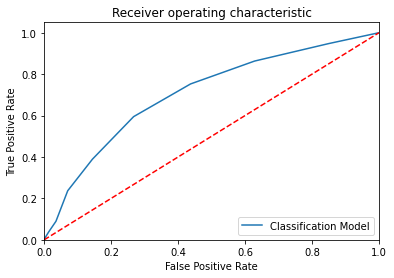

KNN_K_value =  20
Model Name:  KNeighborsClassifier(n_neighbors=20)
Confusion matrix : 
 [[   0  190]
 [   0 1082]]
Outcome values : 
 0 190 0 1082
Classification report : 
               precision    recall  f1-score   support

           1       0.00      0.00      0.00       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.43      0.50      0.46      1272
weighted avg       0.72      0.85      0.78      1272

Accuracy : 85.1 %
Precision : nan %
Recall : 0.0 %
F1 Score : 0.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 50.0 %
MCC : nan
roc_auc_score: 0.5


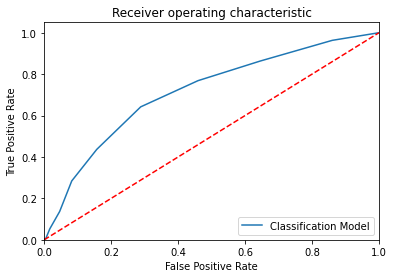

In [29]:
# Bild KNN Model

from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import sklearn.metrics as metrics

from sklearn.metrics import roc_curve, roc_auc_score

accuracy = []

for a in range(1, 21, 1):
    
    k = a
    
    # Build the model
    
    ModelKNN = KNeighborsClassifier(n_neighbors=k)
    
    # Train the model
    
    ModelKNN.fit(x_train, y_train)
    
    # Predict the model
    
    y_pred = ModelKNN.predict(x_test)
    y_pred_prob = ModelKNN.predict_proba(x_test)
    
    print('KNN_K_value = ', a)
    
    # Print the model name
    
    print('Model Name: ', ModelKNN)
    
    # confusion matrix in sklearn
    
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report
    
    # actual values
    
    actual = y_test
    
    # predicted values
    
    predicted = y_pred
    
    # confusion matrix
    
    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)
    
    # outcome values order in sklearn
    
    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)
    
    # classification report for precision, recall f1-score and accuracy
    
    C_Report = classification_report(actual,predicted,labels=[1,0])
    
    print('Classification report : \n', C_Report)
    
    # calculating the metrics
    
    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);
    
    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model
    
    from math import sqrt
    
    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)
    
    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)
    
    # Area under ROC curve 
    
    from sklearn.metrics import roc_curve, roc_auc_score
    
    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, ModelKNN.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    #plt.savefig('Log_ROC')
    plt.show()
    #------------------------------------------------------------------------------
    new_row = {'Model Name' : ModelKNN,
               'KNN K Value' : a,
               'True_Positive' : tp,
               'False_Negative' : fn,
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    KNN_Results = KNN_Results.append(new_row, ignore_index=True)
    #------KNN_Results------------------------------------------------------------------------


In [30]:
KNN_Results.head()

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,KNeighborsClassifier(n_neighbors=1),1,47,143,126,956,0.789,0.272,0.247,0.259,0.884,0.136,0.565459,0.566
1,KNeighborsClassifier(n_neighbors=2),2,11,179,27,1055,0.838,0.289,0.058,0.096,0.975,0.069,0.51647,0.516
2,KNeighborsClassifier(n_neighbors=3),3,27,163,70,1012,0.817,0.278,0.142,0.188,0.935,0.104,0.538705,0.538
3,KNeighborsClassifier(n_neighbors=4),4,7,183,24,1058,0.837,0.226,0.037,0.063,0.978,0.034,0.50733,0.507
4,KNeighborsClassifier(),5,16,174,41,1041,0.831,0.281,0.084,0.13,0.962,0.08,0.523159,0.523


# NAIVE BAYES MODEL

Confusion matrix : 
 [[ 72 118]
 [166 916]]
Outcome values : 
 72 118 166 916
Classification report : 
               precision    recall  f1-score   support

           1       0.30      0.38      0.34       190
           0       0.89      0.85      0.87      1082

    accuracy                           0.78      1272
   macro avg       0.59      0.61      0.60      1272
weighted avg       0.80      0.78      0.79      1272

Accuracy : 77.7 %
Precision : 30.3 %
Recall : 37.9 %
F1 Score : 0.336
Specificity or True Negative Rate : 84.7 %
Balanced Accuracy : 61.3 %
MCC : 0.206
roc_auc_score: 0.613


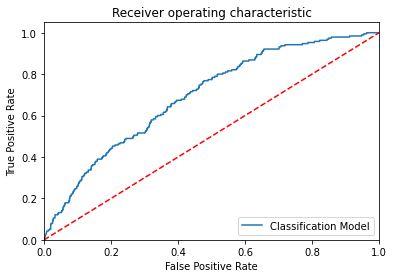

-----------------------------------------------------------------------------------------------------


In [31]:
# Training the Naive Bayes model (GaussianNB) on the Training set

from sklearn.naive_bayes import GaussianNB

modelGNB = GaussianNB(priors=None, var_smoothing=1e-09)

# Fit the model with train data

modelGNB.fit(x_train,y_train)

# Predict the model with test data set

y_pred = modelGNB.predict(x_test)
y_pred_prob = modelGNB.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual,modelGNB.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

# SVM ALGORITHM

In [32]:
EMResults1 = pd.read_csv(r"C:\dataset\EMResults.csv",header=0)
EMResults1.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


Model Name:  SVM - Gaussian
Confusion matrix : 
 [[127  63]
 [337 745]]
Outcome values : 
 127 63 337 745
Classification report : 
               precision    recall  f1-score   support

           1       0.27      0.67      0.39       190
           0       0.92      0.69      0.79      1082

    accuracy                           0.69      1272
   macro avg       0.60      0.68      0.59      1272
weighted avg       0.83      0.69      0.73      1272

Accuracy : 68.6 %
Precision : 27.4 %
Recall : 66.8 %
F1 Score : 0.388
Specificity or True Negative Rate : 68.9 %
Balanced Accuracy : 67.8 %
MCC : 0.264
roc_auc_score: 0.678


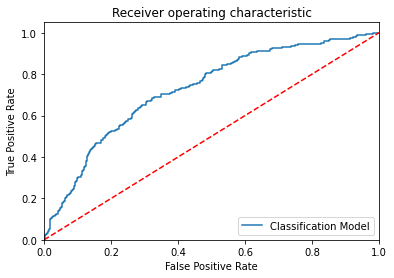

-----------------------------------------------------------------------------------------------------


In [33]:
# Training the SVM algorithm

from sklearn.svm import SVC

ModelSVMGaussian = SVC(kernel='rbf', random_state = 42, class_weight='balanced', probability=True)

# Train the model

ModelSVMGaussian.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVMGaussian.predict(x_test)
y_pred_prob = ModelSVMGaussian.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Print the model name
    
print('Model Name: ', "SVM - Gaussian")

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,ModelSVMGaussian.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Gaussian",
            'True_Positive' : tp, 
            'False_Negative' : fn, 
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults1= EMResults1.append(new_row, ignore_index=True)
#---------------------------------------------------------------------------------------------------------------

Model Name:  SVM - Sigmoid
Confusion matrix : 
 [[ 89 101]
 [510 572]]
Outcome values : 
 89 101 510 572
Classification report : 
               precision    recall  f1-score   support

           1       0.15      0.47      0.23       190
           0       0.85      0.53      0.65      1082

    accuracy                           0.52      1272
   macro avg       0.50      0.50      0.44      1272
weighted avg       0.75      0.52      0.59      1272

Accuracy : 52.0 %
Precision : 14.9 %
Recall : 46.8 %
F1 Score : 0.226
Specificity or True Negative Rate : 52.9 %
Balanced Accuracy : 49.9 %
MCC : -0.002
roc_auc_score: 0.499


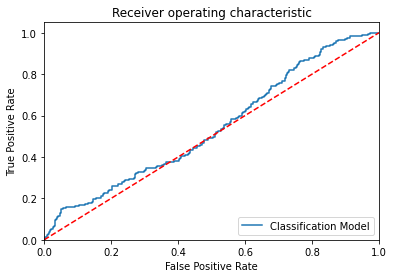

-----------------------------------------------------------------------------------------------------


In [34]:
# Training the SVM algorithm

from sklearn.svm import SVC

ModelSVMSig = SVC(kernel='sigmoid', random_state = 42, class_weight='balanced', probability=True)

# Train the model

ModelSVMSig.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVMSig.predict(x_test)
y_pred_prob = ModelSVMSig.predict_proba(x_test)

# Print the model name
    
print('Model Name: ', "SVM - Sigmoid")

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,ModelSVMSig.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Sigmoid",
            'True_Positive' : tp, 
            'False_Negative' : fn, 
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults1= EMResults1.append(new_row, ignore_index=True)
#-----------------------------------------------------------------------------------------------------------

Model Name:  SVM - Linear
Confusion matrix : 
 [[   0  190]
 [   0 1082]]
Outcome values : 
 0 190 0 1082
Classification report : 
               precision    recall  f1-score   support

           1       0.00      0.00      0.00       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.43      0.50      0.46      1272
weighted avg       0.72      0.85      0.78      1272

Accuracy : 85.1 %
Precision : nan %
Recall : 0.0 %
F1 Score : 0.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 50.0 %
MCC : nan
roc_auc_score: 0.5


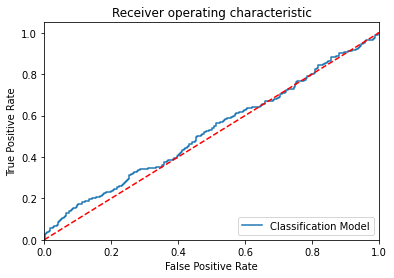

-----------------------------------------------------------------------------------------------------


In [35]:
# Training the SVM algorithm with train dataset

from sklearn.svm import SVC

ModelSVM1 = SVC(C=1.0, kernel='linear', degree=3, gamma='scale', coef0=0.0, shrinking=True, 
                probability=True, tol=0.001, cache_size=200, class_weight=None, verbose=False, 
                max_iter=- 1, decision_function_shape='ovr', break_ties=False, random_state=None)

# Train the model with train data 

ModelSVM1 = ModelSVM1.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVM1.predict(x_test)
y_pred_prob = ModelSVM1.predict_proba(x_test)

# Print the model name
    
print('Model Name: ', "SVM - Linear")

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual,ModelSVM1.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Linear",
            'True_Positive' : tp, 
            'False_Negative' : fn, 
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults1= EMResults1.append(new_row, ignore_index=True)
#-------------------------------------------------------------------------------------------------------------

Model Name:  SVM - Polynominal
Confusion matrix : 
 [[   3  187]
 [   3 1079]]
Outcome values : 
 3 187 3 1079
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.02      0.03       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.68      0.51      0.47      1272
weighted avg       0.80      0.85      0.79      1272

Accuracy : 85.1 %
Precision : 50.0 %
Recall : 1.6 %
F1 Score : 0.031
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 50.6 %
MCC : 0.068
roc_auc_score: 0.507


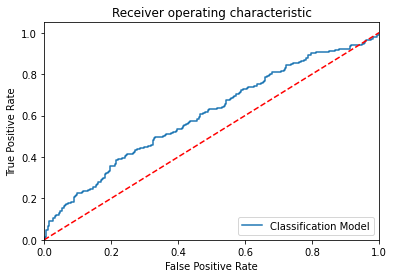

-----------------------------------------------------------------------------------------------------


In [36]:
# Training the SVM algorithm

from sklearn.svm import SVC

ModelSVMPoly = SVC(kernel='poly', degree=2, probability=True)

# Train the model

ModelSVMPoly.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVMPoly.predict(x_test)
y_pred_prob = ModelSVMPoly.predict_proba(x_test)

# Print the model name
    
print('Model Name: ', "SVM - Polynominal")

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,ModelSVMPoly.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Polynominal",
            'True_Positive' : tp, 
            'False_Negative' : fn, 
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults1= EMResults1.append(new_row, ignore_index=True)
#-----------------------------------------------------------------------------------------------

In [37]:
EMResults1.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,SVM - Gaussian,127,63,337,745,0.686,0.274,0.668,0.388,0.689,0.264,0.67848,0.678
1,SVM - Sigmoid,89,101,510,572,0.52,0.149,0.468,0.226,0.529,-0.002,0.498536,0.499
2,SVM - Linear,0,190,0,1082,0.851,NaN,0.0,0.0,1.0,NaN,0.5,0.5
3,SVM - Polynominal,3,187,3,1079,0.851,0.5,0.016,0.031,0.997,0.068,0.506508,0.506


# EXTRATREES

Confusion matrix : 
 [[  13  177]
 [  13 1069]]
Outcome values : 
 13 177 13 1069
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.07      0.12       190
           0       0.86      0.99      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.68      0.53      0.52      1272
weighted avg       0.80      0.85      0.80      1272

Accuracy : 85.1 %
Precision : 50.0 %
Recall : 6.8 %
F1 Score : 0.12
Specificity or True Negative Rate : 98.8 %
Balanced Accuracy : 52.8 %
MCC : 0.142
roc_auc_score: 0.528


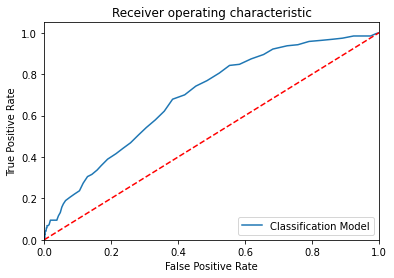

-----------------------------------------------------------------------------------------------------


In [38]:
# To build the 'Random Forest' model with random sampling

from sklearn.ensemble import ExtraTreesClassifier

# Create an object for Extra Trees Classifier 

ModelET = ExtraTreesClassifier()

# Train the model with train data 

ModelET.fit(x_train,y_train)

# Predict the model with test data set

y_pred = ModelET.predict(x_test)
y_pred_prob = ModelET.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual, predicted, labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelET.predict_proba(x_test)[:,1])
plt.figure()
#--------------------------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')


In [39]:
HDdata.columns

Index(['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
       'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD'],
      dtype='object')

In [40]:
# Create a list for plotting the decision trees

figcols = ['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
       'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD']

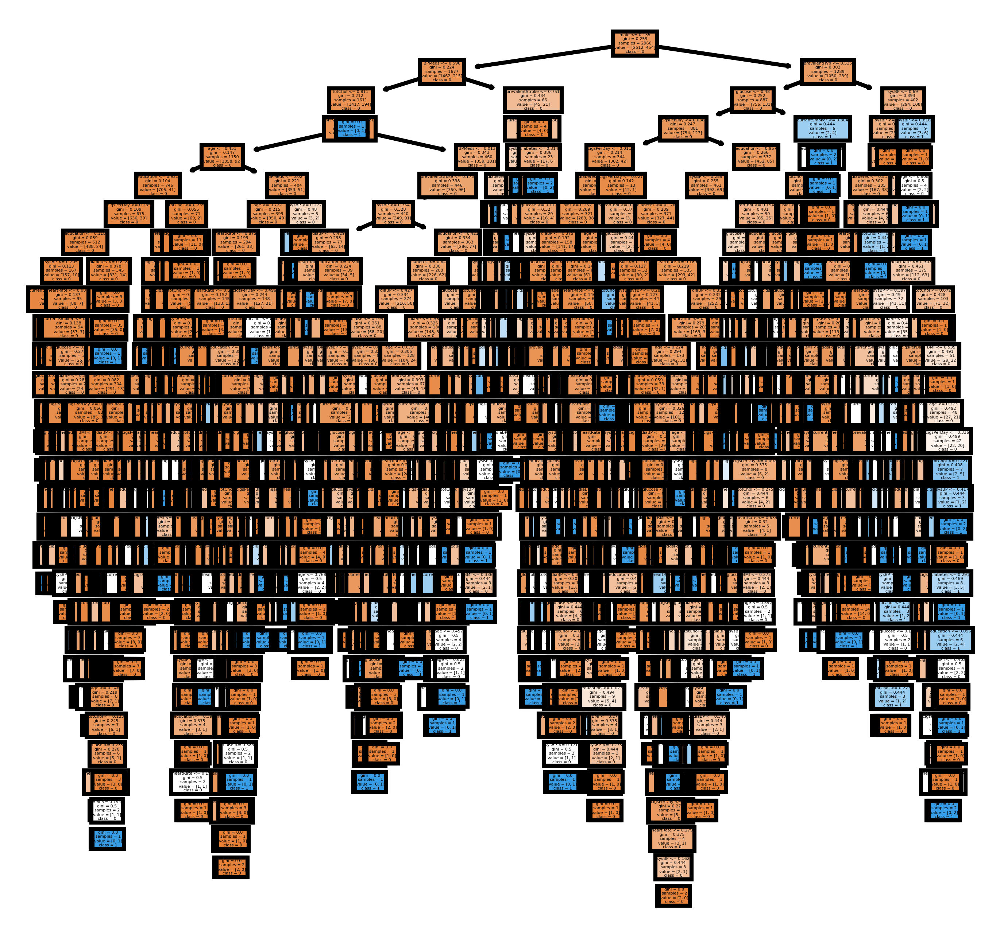

In [41]:
# Visualize individual trees and code below visualizes the first decision tree of Extra Trees Classifier

from sklearn import tree

fn1=figcols
cn1=['0','1']

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(ModelET.estimators_[0],
               feature_names = fn1, 
               class_names=cn1,
               filled = True);
#fig.savefig('ModelET.png')


In [42]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Extra Trees Classifier

from sklearn import tree

fn2=figcols
cn2=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(ModelET.estimators_[index],
                   feature_names = fn2, 
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)


# Compare with classification algorithm

In [43]:
EMResults = pd.read_csv(r"C:\dataset\EMResults.csv",header=0)
EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


Model Name:  LogisticRegression()
Confusion matrix : 
 [[   8  182]
 [   5 1077]]
Outcome values : 
 8 182 5 1077
Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.04      0.08       190
           0       0.86      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.74      0.52      0.50      1272
weighted avg       0.82      0.85      0.79      1272

Accuracy : 85.3 %
Precision : 61.5 %
Recall : 4.2 %
F1 Score : 0.079
Specificity or True Negative Rate : 99.5 %
Balanced Accuracy : 51.8 %
MCC : 0.133
roc_auc_score: 0.519


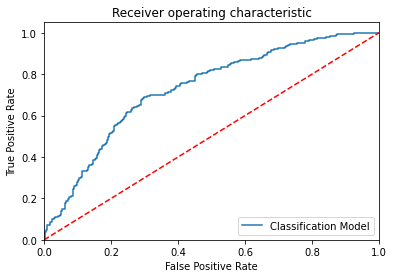

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[ 77 113]
 [324 758]]
Outcome values : 
 77 113 324 758
Classification report : 
               precision    recall  f1-score   support

           1       0.19      0.41      0.26       190
           0       0.87      0.70      0.78      1082

    accuracy                           0.66      1272
   macro avg       0.53      0.55      0.52      1272
weighted avg       0.77      0.66      0.70      1272

Accuracy : 65.6 %
Precision : 19.2 %
Recall : 40.5 %
F1 Score : 0.261
Specificity or True Negative Rate : 70.1 %
Balanced Accuracy : 55.3 %
MCC : 0.081
roc_auc_score: 0.553


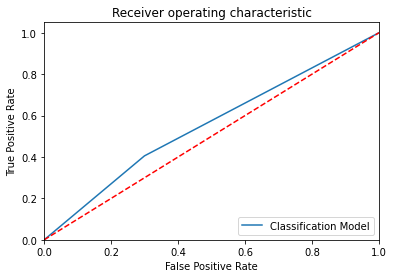

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[  11  179]
 [  10 1072]]
Outcome values : 
 11 179 10 1072
Classification report : 
               precision    recall  f1-score   support

           1       0.52      0.06      0.10       190
           0       0.86      0.99      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.69      0.52      0.51      1272
weighted avg       0.81      0.85      0.80      1272

Accuracy : 85.1 %
Precision : 52.4 %
Recall : 5.8 %
F1 Score : 0.104
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 52.4 %
MCC : 0.136
roc_auc_score: 0.524


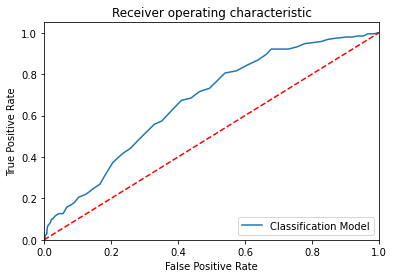

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[  10  180]
 [  10 1072]]
Outcome values : 
 10 180 10 1072
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.05      0.10       190
           0       0.86      0.99      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.68      0.52      0.51      1272
weighted avg       0.80      0.85      0.80      1272

Accuracy : 85.1 %
Precision : 50.0 %
Recall : 5.3 %
F1 Score : 0.095
Specificity or True Negative Rate : 99.1 %
Balanced Accuracy : 52.2 %
MCC : 0.124
roc_auc_score: 0.522


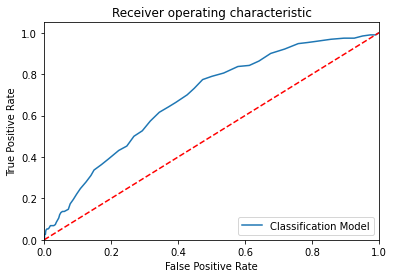

-----------------------------------------------------------------------------------------------------
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[  16  174]
 [  41 1041]]
Outcome values : 
 16 174 41 1041
Classification report : 
               precision    recall  f1-score   support

           1       0.28      0.08      0.13       190
           0       0.86      0.96      0.91      1082

    accuracy                           0.83      1272
   macro avg       0.57      0.52      0.52      1272
weighted avg       0.77      0.83      0.79      1272

Accuracy : 83.1 %
Precision : 28.1 %
Recall : 8.4 %
F1 Score : 0.13
Specificity or True Negative Rate : 96.2 %
Balanced Accuracy : 52.3 %
MCC : 0.08
roc_auc_score: 0.523


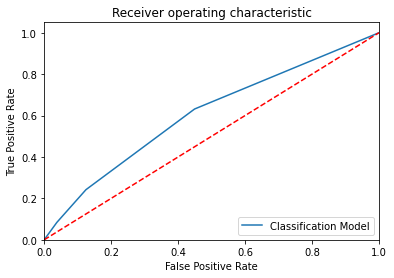

-----------------------------------------------------------------------------------------------------
Model Name:  GaussianNB()
Confusion matrix : 
 [[ 72 118]
 [166 916]]
Outcome values : 
 72 118 166 916
Classification report : 
               precision    recall  f1-score   support

           1       0.30      0.38      0.34       190
           0       0.89      0.85      0.87      1082

    accuracy                           0.78      1272
   macro avg       0.59      0.61      0.60      1272
weighted avg       0.80      0.78      0.79      1272

Accuracy : 77.7 %
Precision : 30.3 %
Recall : 37.9 %
F1 Score : 0.336
Specificity or True Negative Rate : 84.7 %
Balanced Accuracy : 61.3 %
MCC : 0.206
roc_auc_score: 0.613


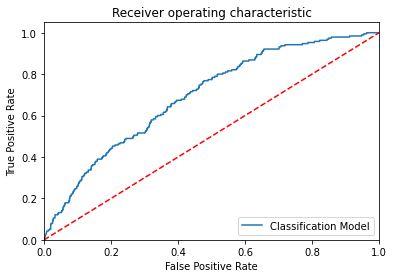

-----------------------------------------------------------------------------------------------------
Model Name:  SVC(probability=True)
Confusion matrix : 
 [[   2  188]
 [   2 1080]]
Outcome values : 
 2 188 2 1080
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.01      0.02       190
           0       0.85      1.00      0.92      1082

    accuracy                           0.85      1272
   macro avg       0.68      0.50      0.47      1272
weighted avg       0.80      0.85      0.78      1272

Accuracy : 85.1 %
Precision : 50.0 %
Recall : 1.1 %
F1 Score : 0.021
Specificity or True Negative Rate : 99.8 %
Balanced Accuracy : 50.4 %
MCC : 0.055
roc_auc_score: 0.504


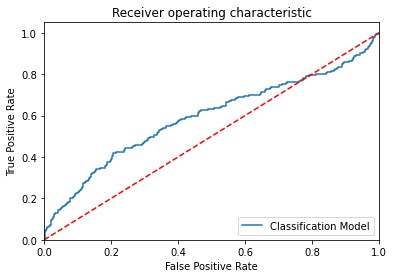

-----------------------------------------------------------------------------------------------------


In [44]:
# Build the Calssification models and compare the results

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

# Create objects of classification algorithms with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
ModelKNN = KNeighborsClassifier(n_neighbors=5)
ModelGNB = GaussianNB()
ModelSVM = SVC(probability=True)

# Evalution matrix for all the algorithms

#MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelGNB, ModelSVM]
MM = [ModelLR, ModelDC, ModelRF, ModelET,ModelKNN, ModelGNB, ModelSVM]
for models in MM:
            
    # Train the model training dataset
    
    models.fit(x_train, y_train)
    
    # Prediction the model with test dataset
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    Model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    #
    plt.plot(fpr, tpr, label= 'Classification Model' % Model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #----------------------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'True_Positive': tp,
               'False_Negative': fn, 
               'False_Positive': fp, 
               'True_Negative': tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults = EMResults.append(new_row, ignore_index=True)
    #----------------------------------------------------------------------------------------------------------
#======================================================================================================================>

In [48]:
EMResults.head(7)

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,LogisticRegression(),8,182,5,1077,0.853,0.615,0.042,0.079,0.995,0.133,0.518742,0.518
1,DecisionTreeClassifier(),77,113,324,758,0.656,0.192,0.405,0.261,0.701,0.081,0.552909,0.553
2,"(DecisionTreeClassifier(max_features='auto', r...",11,179,10,1072,0.851,0.524,0.058,0.104,0.991,0.136,0.524326,0.524
3,"(ExtraTreeClassifier(random_state=1060334767),...",10,180,10,1072,0.851,0.5,0.053,0.095,0.991,0.124,0.521695,0.522
4,KNeighborsClassifier(),16,174,41,1041,0.831,0.281,0.084,0.13,0.962,0.08,0.523159,0.523
5,GaussianNB(),72,118,166,916,0.777,0.303,0.379,0.336,0.847,0.206,0.612764,0.613
6,SVC(probability=True),2,188,2,1080,0.851,0.5,0.011,0.021,0.998,0.055,0.504339,0.504


#  RESULT

In [49]:
#predict the values

y_pred1=ModelLR.predict(x_test)

In [50]:
#create new dataframe with 'actual' vs 'predict' values

Results = pd.DataFrame({'TenYearCHD_A':y_test, 'TenYearCHD_P':y_pred})

# Merge two Dataframes on index of both the dataframes

ResultsFinal = HDdata.merge(Results, left_index=True, right_index=True)

# Display 5 records randomly

ResultsFinal.sample(10)


,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD,TenYearCHD_A,TenYearCHD_P
2543,0,48,1.0,0,0.0,0.00000,0,1,0,234.0,144.0,90.0,29.34,72.0,70.000000,0,0,0
1616,0,41,1.0,0,0.0,0.02963,0,0,0,179.0,121.0,83.0,23.04,66.0,90.000000,0,0,0
2466,1,64,1.0,0,0.0,0.00000,0,1,0,189.0,156.0,69.0,21.68,66.0,100.000000,0,0,0
970,1,52,1.0,1,3.0,0.00000,0,1,0,199.0,134.0,98.0,27.78,75.0,89.000000,1,1,0
1377,0,43,2.0,0,0.0,1.00000,0,1,0,234.0,127.0,88.0,33.17,85.0,81.966753,0,0,0
56,0,54,1.0,1,9.0,0.00000,0,0,1,266.0,114.0,76.0,17.61,88.0,55.000000,0,0,0
3402,1,53,1.0,1,11.0,1.00000,0,1,0,228.0,132.5,55.0,19.97,90.0,83.000000,1,1,0
240,1,65,4.0,0,0.0,0.00000,0,0,0,207.0,139.0,88.0,24.04,80.0,73.000000,0,0,0
1348,1,42,4.0,0,0.0,0.00000,0,0,0,225.0,110.0,73.0,27.67,65.0,65.000000,0,0,0
4183,0,37,1.0,0,0.0,0.00000,0,0,0,208.0,118.5,70.0,25.09,70.0,85.000000,0,0,0
